<a href="https://colab.research.google.com/github/dawoodwasif/Customer-Audio-Analytics-of-Accent-and-Sentiment/blob/main/1_Speech_Accent_Feature_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Installation, Load Dataset and Imports

In [1]:
! pip install kaggle
! pip install Boruta
! pip install pyod
! pip install combo

     |████████████████████████████████| 56 kB 2.6 MB/s 
     |████████████████████████████████| 114 kB 7.1 MB/s 
  Created wheel for pyod: filename=pyod-0.9.8-py3-none-any.whl size=136775 sha256=0099a601ca27326ee3d82677325b517dc73bcb14c9c04d20eb23cdd05ae44a5b
  Stored in directory: /root/.cache/pip/wheels/ba/8f/95/6cb376aec9fae09d9b1622d1662c902b522deb353cb80836a6
Successfully built pyod
  Created wheel for combo: filename=combo-0.1.2-py3-none-any.whl size=42026 sha256=caa521bb97d953e8b052241d0311c125198740c80519fc5a613076a89b484023
  Stored in directory: /root/.cache/pip/wheels/cf/2e/45/d4cb985fb061e3ab636d350b76114d2639d84eab16225c7776
Successfully built combo


In [2]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download rtatman/speech-accent-archive
! unzip /content/speech-accent-archive.zip

100% 865M/865M [00:09<00:00, 101MB/s]
100% 865M/865M [00:09<00:00, 95.5MB/s]
Archive:  /content/speech-accent-archive.zip
  inflating: reading-passage.txt     
  inflating: recordings/recordings/afrikaans1.mp3  
  inflating: recordings/recordings/afrikaans2.mp3  
  inflating: recordings/recordings/afrikaans3.mp3  
  inflating: recordings/recordings/afrikaans4.mp3  
  inflating: recordings/recordings/afrikaans5.mp3  
  inflating: recordings/recordings/agni1.mp3  
  inflating: recordings/recordings/akan1.mp3  
  inflating: recordings/recordings/albanian1.mp3  
  inflating: recordings/recordings/albanian2.mp3  
  inflating: recordings/recordings/albanian3.mp3  
  inflating: recordings/recordings/albanian4.mp3  
  inflating: recordings/recordings/albanian5.mp3  
  inflating: recordings/recordings/albanian6.mp3  
  inflating: recordings/recordings/albanian7.mp3  
  inflating: recordings/recordings/albanian8.mp3  
  inflating: recordings/recordings/albanian9.mp3  
  inflating: recordings/rec

In [3]:
import pandas as pd
import numpy as np

import os
import sys

# librosa is a Python library for analyzing audio and music. It can be used to extract the data from the audio files we will see it later.
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# to play the audio files
from IPython.display import Audio

import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint

import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
%matplotlib inline
import matplotlib.pyplot as plt
import time
from pathlib import Path
from tqdm import tqdm_notebook as tqdm
from librosa.core import istft
import csv

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.feature_selection import SelectFromModel
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

from pyod.models.ecod import ECOD
import matplotlib.font_manager as mpfm
from numpy import percentile

from boruta import BorutaPy
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score 
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF
from sklearn.preprocessing import MinMaxScaler

import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Define utilty functions

### Functions to visualize audio

In [4]:
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} accent'.format(e), size=15)
    librosa.display.waveplot(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for audio with {} accent'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()

### Functions to preprocess data

In [5]:
def preemphasis(data):
    data = librosa.effects.preemphasis(data)
    return data

def framing(data):
  frame_size = 0.025
  frame_stride = 0.01

  frame_length, frame_step = frame_size * sample_rate, frame_stride * sample_rate  # Convert from seconds to samples
  signal_length = len(data)
  frame_length = int(round(frame_length))
  frame_step = int(round(frame_step))
  num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))  # Make sure that we have at least 1 frame

  pad_signal_length = num_frames * frame_step + frame_length
  z = np.zeros((pad_signal_length - signal_length))
  pad_signal = np.append(data, z) # Pad Signal to make sure that all frames have equal number of samples without truncating any samples from the original signal

  indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
  frames = pad_signal[indices.astype(np.int32, copy=False)]
  return frames, frame_length

def windowing(data, f_len):
  data *= np.hamming(f_len)
  return data

def remove_silence(data):
  frames_without_silence = []
  for index in range(0,len(data)):
      if max(data[index]) > 0.0025:
          frames_without_silence.append(data[index])  
  return frames_without_silence

In [6]:
def preprocessing(data):
  pe_data = preemphasis(data)
  frames,rate=framing(pe_data)
  frame_list = windowing(frames,rate)
  final_frames = remove_silence(frame_list)
  vocals = istft(np.array(final_frames))
  return vocals

### Functions for data augmentation

In [7]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate)

def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sampling_rate, pitch_factor)

### Functions to extract features

In [8]:
def extract_features(data):
    
    # ZCR
    result = np.array([])
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result=np.hstack((result, zcr)) # stacking horizontally


    # Chroma_stft
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft)) # stacking horizontally

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc)) # stacking horizontally

    # Root Mean Square Value
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms)) # stacking horizontally

    # Melspectogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel))

    # Spectral Centroid
    sc = np.mean(librosa.feature.spectral_centroid(data, sr=sample_rate).T, axis=0) 
    result = np.hstack((result, sc)) # stacking horizontally

    # Spectral Bandwidth
    sb = np.mean(librosa.feature.spectral_bandwidth(data, sr=sample_rate).T, axis=0) 
    result = np.hstack((result, sb)) # stacking horizontally

    # Spectral Rolloff
    sr = np.mean(librosa.feature.spectral_rolloff(data, sr=sample_rate).T, axis=0) 
    result = np.hstack((result, sr)) # stacking horizontally
    
    return result

def get_features(path):
    # duration and offset are used to take care of the no audio in start and the ending of each audio files as seen above.
    data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)
    
    #apply preprocessing to data
    data = preprocessing(data)
    
    # without augmentation
    res1 = extract_features(data)
    result = np.array(res1)
    
    # data with noise
    noise_data = noise(data)
    res2 = extract_features(noise_data)
    result = np.vstack((result, res2)) # stacking vertically
    
    # data with stretching and pitching
    new_data = stretch(data)
    data_stretch_pitch = pitch(new_data, sample_rate)
    res3 = extract_features(data_stretch_pitch)
    result = np.vstack((result, res3)) # stacking vertically
    
    return result

def get_accent(path):
  p = path.rfind('/')
  q = path.rfind('.')
  file_name = path[p+1:q]
  result = ''.join([i for i in file_name if not i.isdigit()])
  return result

def get_filename(path):
  p = path.rfind('/')
  q = path.rfind('.')
  file_name = path[p+1:q]
  return file_name

def correct_features_list(f_list):
  newList = []
  for f in f_list:
    if '.' in f:
      f = f[:-2]
    newList.append(f)
  return newList
    

### Test functions

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


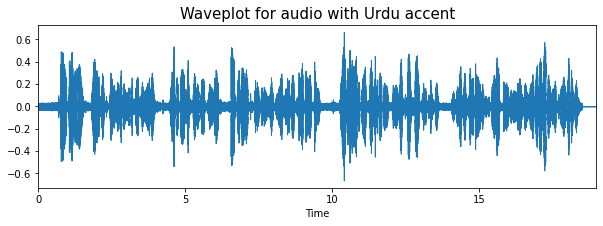

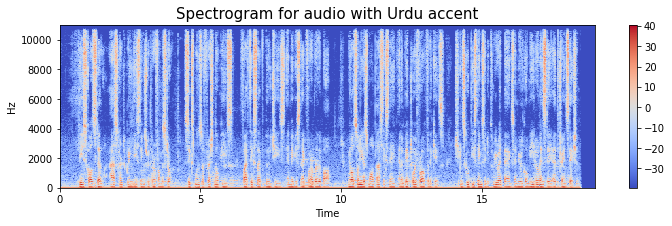

In [9]:
path = '/content/recordings/recordings/urdu5.mp3'
accent = "Urdu"
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, accent)
create_spectrogram(data, sampling_rate, accent)
Audio(path)

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


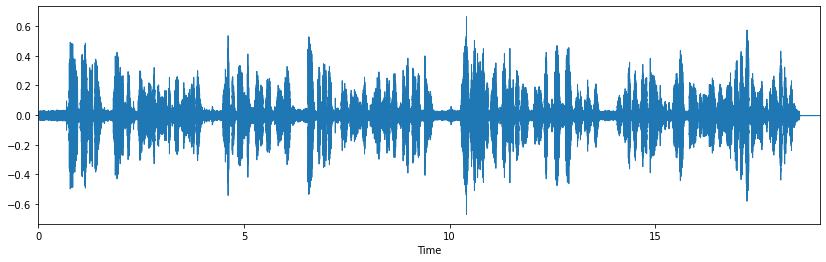

In [10]:
data, sample_rate = librosa.load(path)

plt.figure(figsize=(14,4))
librosa.display.waveplot(y=data, sr=sample_rate)
Audio(path)

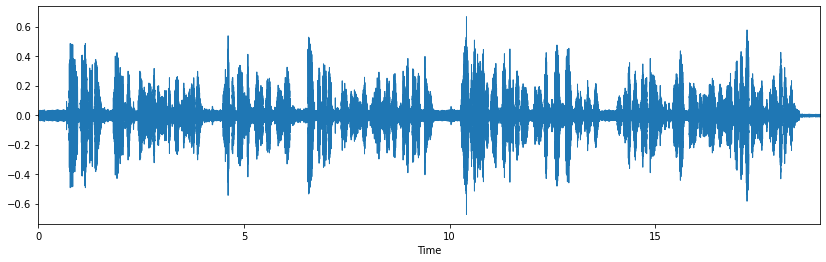

In [11]:
x = noise(data)
plt.figure(figsize=(14,4))
librosa.display.waveplot(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

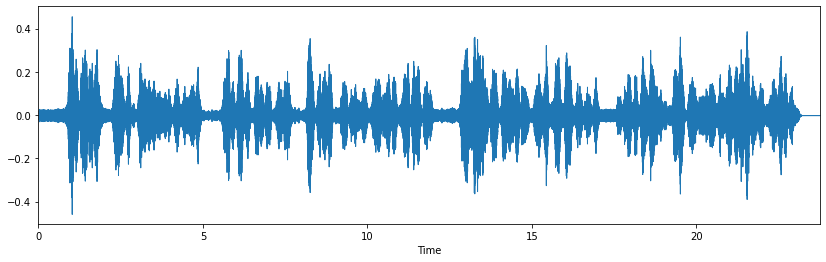

In [12]:
x = stretch(data)
plt.figure(figsize=(14,4))
librosa.display.waveplot(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

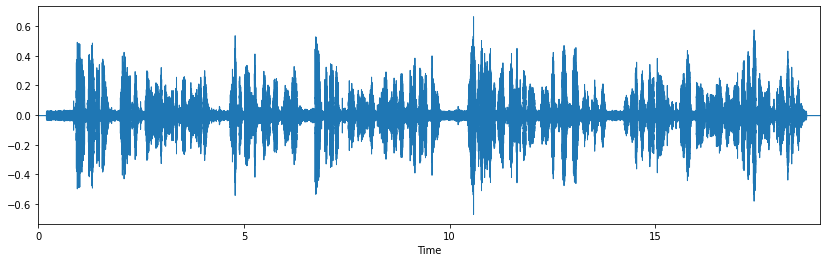

In [13]:
x = shift(data)
plt.figure(figsize=(14,4))
librosa.display.waveplot(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

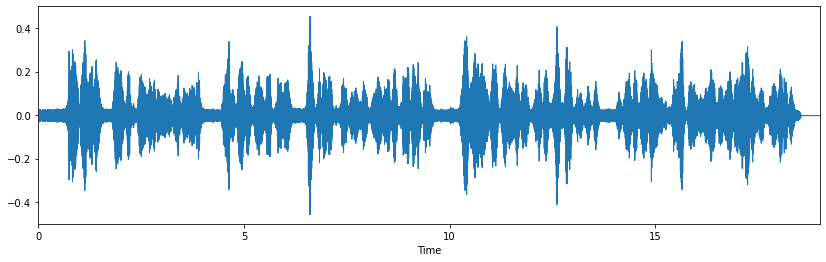

In [14]:
x = pitch(data, sample_rate)
plt.figure(figsize=(14,4))
librosa.display.waveplot(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

## Exploratory Data Analysis

In [15]:
# Read the data set of "All Speakers" in data.
AllSpeakers = pd.read_csv("/content/speakers_all.csv")

# Printing the data
AllSpeakers

,age,age_onset,birthplace,filename,native_language,sex,speakerid,country,file_missing?,Unnamed: 9,Unnamed: 10,Unnamed: 11
0,24.0,12.0,"koussi, senegal",balanta,balanta,male,788,senegal,True,NaN,NaN,NaN
1,18.0,10.0,"buea, cameroon",cameroon,cameroon,male,1953,cameroon,True,NaN,NaN,NaN
2,48.0,8.0,"hong, adamawa, nigeria",fulfulde,fulfulde,male,1037,nigeria,True,NaN,NaN,NaN
3,42.0,42.0,"port-au-prince, haiti",haitian,haitian,male,1165,haiti,True,NaN,NaN,NaN
4,40.0,35.0,"port-au-prince, haiti",haitian,haitian,male,1166,haiti,True,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2167,46.0,5.0,"lagos, nigeria",yoruba3,yoruba,female,766,nigeria,False,NaN,NaN,NaN
2168,46.0,12.0,"lagos, nigeria",yoruba4,yoruba,male,851,nigeria,False,NaN,NaN,NaN
2169,47.0,2.0,"ibadan, nigeria",yoruba5,yoruba,female,2023,nigeria,False,NaN,NaN,NaN
2170,31.0,1.0,"bethel, alaska, usa",yupik1,yupik,female,571,usa,False,NaN,NaN,NaN


In [16]:
# Delete last 3 empty columns
# Warning: run only once

N = 3
# Drop last N columns of dataframe
for i in range(N):
        del AllSpeakers[AllSpeakers.columns.values[-1]]

AllSpeakers.head()

,age,age_onset,birthplace,filename,native_language,sex,speakerid,country,file_missing?
0,24.0,12.0,"koussi, senegal",balanta,balanta,male,788,senegal,True
1,18.0,10.0,"buea, cameroon",cameroon,cameroon,male,1953,cameroon,True
2,48.0,8.0,"hong, adamawa, nigeria",fulfulde,fulfulde,male,1037,nigeria,True
3,42.0,42.0,"port-au-prince, haiti",haitian,haitian,male,1165,haiti,True
4,40.0,35.0,"port-au-prince, haiti",haitian,haitian,male,1166,haiti,True


In [17]:
AllSpeakers.drop(AllSpeakers.loc[AllSpeakers['file_missing?']].index, inplace=True)
AllSpeakers.head()

,age,age_onset,birthplace,filename,native_language,sex,speakerid,country,file_missing?
32,27.0,9.0,"virginia, south africa",afrikaans1,afrikaans,female,1,south africa,False
33,40.0,5.0,"pretoria, south africa",afrikaans2,afrikaans,male,2,south africa,False
34,43.0,4.0,"pretoria, transvaal, south africa",afrikaans3,afrikaans,male,418,south africa,False
35,26.0,8.0,"pretoria, south africa",afrikaans4,afrikaans,male,1159,south africa,False
36,19.0,6.0,"cape town, south africa",afrikaans5,afrikaans,male,1432,south africa,False


In [18]:
AllSpeakers.head()

,age,age_onset,birthplace,filename,native_language,sex,speakerid,country,file_missing?
32,27.0,9.0,"virginia, south africa",afrikaans1,afrikaans,female,1,south africa,False
33,40.0,5.0,"pretoria, south africa",afrikaans2,afrikaans,male,2,south africa,False
34,43.0,4.0,"pretoria, transvaal, south africa",afrikaans3,afrikaans,male,418,south africa,False
35,26.0,8.0,"pretoria, south africa",afrikaans4,afrikaans,male,1159,south africa,False
36,19.0,6.0,"cape town, south africa",afrikaans5,afrikaans,male,1432,south africa,False


In [19]:
# form a dictionary with format { 'filanem' : 'country' }
birthplace = {x: y for x, y in zip(AllSpeakers['filename'], AllSpeakers['country'])}
        
birthplace['urdu6']

'india'

In [20]:
# check for missing values
AllSpeakers.isnull().sum()

age                0
age_onset          0
birthplace         4
filename           0
native_language    0
sex                0
speakerid          0
country            5
file_missing?      0
dtype: int64

In [21]:
AllSpeakers.birthplace.fillna('NaN', inplace = True)
AllSpeakers.country.fillna('NaN', inplace = True)

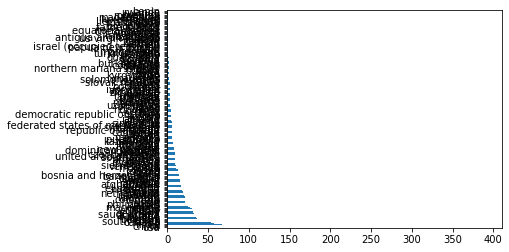

In [23]:
AllSpeakers.age.value_counts(normalize=False)

#plot the bar graph of age vs country
AllSpeakers.country.value_counts(normalize=False).plot.barh()
plt.show()

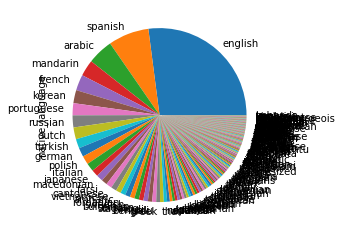

In [24]:
#plot the pie chart of native languages categories
AllSpeakers.native_language.value_counts(normalize=True).plot.pie()
plt.show()

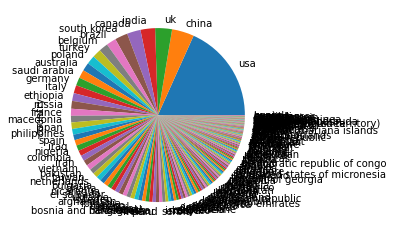

In [25]:
#plot the pie chart of countries categories
AllSpeakers.country.value_counts(normalize=True).plot.pie()
plt.show()

## Perfrom Feature Extraction

In [26]:
warnings.filterwarnings('ignore')
X , Y , BP = [], [], []

pathlist = Path('/content/recordings/recordings').glob('**/*.mp3')
for path in tqdm(pathlist):
    feature = get_features(path)
    accent = get_accent(str(path))
    for ele in feature:
        BP.append(birthplace[get_filename(str(path))])  
        X.append(ele)
        Y.append(accent)


0it [00:00, ?it/s]

In [27]:
Features = pd.DataFrame(X)
Features['accent'] = Y
Features['birthplace'] = BP
Features.head()

,0,1,2,3,4,5,6,7,8,9,...,157,158,159,160,161,162,163,164,accent,birthplace
0,0.466376,0.772663,0.935931,0.841119,0.490650,0.715298,0.751078,0.517722,0.363952,0.401343,...,0.000030,0.000012,3.262847e-05,5.172814e-05,7.173444e-06,5224.195233,3221.577031,8847.183200,english,usa
1,0.465896,0.816212,0.956530,0.803407,0.539246,0.801148,0.739026,0.516715,0.441730,0.475705,...,0.000032,0.000014,3.430074e-05,5.340708e-05,9.091718e-06,5264.005308,3203.396503,8869.111507,english,usa
2,0.495695,0.725038,0.690444,0.935274,0.759802,0.467596,0.775093,0.747259,0.489822,0.397915,...,0.000003,0.000005,4.085403e-06,8.141113e-07,9.257938e-08,5276.636414,3180.048442,9152.086325,english,usa
3,0.335107,0.552419,0.763774,0.836982,0.918955,0.498119,0.580258,0.511143,0.553573,0.760017,...,0.000006,0.000012,4.705746e-07,2.848667e-07,1.978164e-06,4307.828387,2800.928418,7537.663023,xiang,china
4,0.336335,0.558801,0.765071,0.838508,0.921972,0.514009,0.587559,0.517223,0.560954,0.765557,...,0.000006,0.000012,5.027311e-07,3.163723e-07,2.004970e-06,4364.999139,2835.087335,7636.298986,xiang,china


In [28]:
feat_headers=['zcr','chroma_stft0','chroma_stft1','chroma_stft2','chroma_stft3','chroma_stft4','chroma_stft5','chroma_stft6','chroma_stft7','chroma_stft8','chroma_stft9','chroma_stft10','chroma_stft11', 'mfcc0', 'mfcc1','mfcc2','mfcc3','mfcc4','mfcc5','mfcc6','mfcc7','mfcc8','mfcc9','mfcc10','mfcc11','mfcc12','mfcc13','mfcc14','mfcc15','mfcc16','mfcc17','mfcc18','mfcc19', 'rms','mel0', 'mel1', 'mel2', 'mel3', 'mel4', 'mel5', 'mel6', 'mel7', 'mel8', 'mel9', 'mel10', 'mel11', 'mel12', 'mel13', 'mel14', 'mel15', 'mel16', 'mel17', 'mel18', 'mel19', 'mel20', 'mel21', 'mel22', 'mel23', 'mel24', 'mel25', 'mel26', 'mel27', 'mel28', 'mel29', 'mel30', 'mel31', 'mel32', 'mel33', 'mel34', 'mel35', 'mel36', 'mel37', 'mel38', 'mel39', 'mel40', 'mel41', 'mel42', 'mel43', 'mel44', 'mel45', 'mel46', 'mel47', 'mel48', 'mel49', 'mel50', 'mel51', 'mel52', 'mel53', 'mel54', 'mel55', 'mel56', 'mel57', 'mel58', 'mel59', 'mel60', 'mel61', 'mel62', 'mel63', 'mel64', 'mel65', 'mel66', 'mel67', 'mel68', 'mel69', 'mel70', 'mel71', 'mel72', 'mel73', 'mel74', 'mel75', 'mel76', 'mel77', 'mel78', 'mel79', 'mel80', 'mel81', 'mel82', 'mel83', 'mel84', 'mel85', 'mel86', 'mel87', 'mel88', 'mel89', 'mel90', 'mel91', 'mel92', 'mel93', 'mel94', 'mel95', 'mel96', 'mel97', 'mel98', 'mel99', 'mel100', 'mel101', 'mel102', 'mel103', 'mel104', 'mel105', 'mel106', 'mel107', 'mel108', 'mel109', 'mel110', 'mel111', 'mel112', 'mel113', 'mel114', 'mel115', 'mel116', 'mel117', 'mel118', 'mel119', 'mel120', 'mel121', 'mel122', 'mel123', 'mel124', 'mel125', 'mel126', 'mel127' ,'centroid','bandwidth','rolloff' ]
for i in range(0,165):
  Features = Features.rename({i : feat_headers[i]}, axis=1)
Features.head()

,zcr,chroma_stft0,chroma_stft1,chroma_stft2,chroma_stft3,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,...,mel123,mel124,mel125,mel126,mel127,centroid,bandwidth,rolloff,accent,birthplace
0,0.466376,0.772663,0.935931,0.841119,0.490650,0.715298,0.751078,0.517722,0.363952,0.401343,...,0.000030,0.000012,3.262847e-05,5.172814e-05,7.173444e-06,5224.195233,3221.577031,8847.183200,english,usa
1,0.465896,0.816212,0.956530,0.803407,0.539246,0.801148,0.739026,0.516715,0.441730,0.475705,...,0.000032,0.000014,3.430074e-05,5.340708e-05,9.091718e-06,5264.005308,3203.396503,8869.111507,english,usa
2,0.495695,0.725038,0.690444,0.935274,0.759802,0.467596,0.775093,0.747259,0.489822,0.397915,...,0.000003,0.000005,4.085403e-06,8.141113e-07,9.257938e-08,5276.636414,3180.048442,9152.086325,english,usa
3,0.335107,0.552419,0.763774,0.836982,0.918955,0.498119,0.580258,0.511143,0.553573,0.760017,...,0.000006,0.000012,4.705746e-07,2.848667e-07,1.978164e-06,4307.828387,2800.928418,7537.663023,xiang,china
4,0.336335,0.558801,0.765071,0.838508,0.921972,0.514009,0.587559,0.517223,0.560954,0.765557,...,0.000006,0.000012,5.027311e-07,3.163723e-07,2.004970e-06,4364.999139,2835.087335,7636.298986,xiang,china


In [29]:
Features.to_csv('features.csv', index=False)

In [30]:
Features = pd.DataFrame()
Features = pd.read_csv('/content/features.csv')
Features.head()

,zcr,chroma_stft0,chroma_stft1,chroma_stft2,chroma_stft3,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,...,mel123,mel124,mel125,mel126,mel127,centroid,bandwidth,rolloff,accent,birthplace
0,0.466376,0.772663,0.935931,0.841119,0.490650,0.715298,0.751078,0.517722,0.363952,0.401343,...,0.000030,0.000012,3.262847e-05,5.172814e-05,7.173444e-06,5224.195233,3221.577031,8847.183200,english,usa
1,0.465896,0.816212,0.956530,0.803407,0.539246,0.801148,0.739026,0.516715,0.441730,0.475705,...,0.000032,0.000014,3.430074e-05,5.340708e-05,9.091718e-06,5264.005308,3203.396503,8869.111507,english,usa
2,0.495695,0.725038,0.690444,0.935274,0.759802,0.467596,0.775093,0.747259,0.489822,0.397915,...,0.000003,0.000005,4.085403e-06,8.141113e-07,9.257938e-08,5276.636414,3180.048442,9152.086325,english,usa
3,0.335107,0.552419,0.763774,0.836982,0.918955,0.498119,0.580258,0.511143,0.553573,0.760017,...,0.000006,0.000012,4.705746e-07,2.848667e-07,1.978164e-06,4307.828387,2800.928418,7537.663023,xiang,china
4,0.336335,0.558801,0.765071,0.838508,0.921972,0.514009,0.587559,0.517223,0.560954,0.765557,...,0.000006,0.000012,5.027311e-07,3.163723e-07,2.004970e-06,4364.999139,2835.087335,7636.298986,xiang,china


## Feature selection

### Variance Threshold



In [31]:
NumericalFeatures = Features.select_dtypes('number')
NumericalFeatures.head()

,zcr,chroma_stft0,chroma_stft1,chroma_stft2,chroma_stft3,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,...,mel121,mel122,mel123,mel124,mel125,mel126,mel127,centroid,bandwidth,rolloff
0,0.466376,0.772663,0.935931,0.841119,0.490650,0.715298,0.751078,0.517722,0.363952,0.401343,...,0.000059,0.000014,0.000030,0.000012,3.262847e-05,5.172814e-05,7.173444e-06,5224.195233,3221.577031,8847.183200
1,0.465896,0.816212,0.956530,0.803407,0.539246,0.801148,0.739026,0.516715,0.441730,0.475705,...,0.000061,0.000015,0.000032,0.000014,3.430074e-05,5.340708e-05,9.091718e-06,5264.005308,3203.396503,8869.111507
2,0.495695,0.725038,0.690444,0.935274,0.759802,0.467596,0.775093,0.747259,0.489822,0.397915,...,0.000356,0.000124,0.000003,0.000005,4.085403e-06,8.141113e-07,9.257938e-08,5276.636414,3180.048442,9152.086325
3,0.335107,0.552419,0.763774,0.836982,0.918955,0.498119,0.580258,0.511143,0.553573,0.760017,...,0.000012,0.000017,0.000006,0.000012,4.705746e-07,2.848667e-07,1.978164e-06,4307.828387,2800.928418,7537.663023
4,0.336335,0.558801,0.765071,0.838508,0.921972,0.514009,0.587559,0.517223,0.560954,0.765557,...,0.000012,0.000017,0.000006,0.000012,5.027311e-07,3.163723e-07,2.004970e-06,4364.999139,2835.087335,7636.298986


In [32]:
scaler = StandardScaler()
NumericalFeatures = pd.DataFrame(scaler.fit_transform(NumericalFeatures), columns = NumericalFeatures.columns)
NumericalFeatures.head()

,zcr,chroma_stft0,chroma_stft1,chroma_stft2,chroma_stft3,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,...,mel121,mel122,mel123,mel124,mel125,mel126,mel127,centroid,bandwidth,rolloff
0,0.388338,0.791748,1.579044,1.046306,-0.752871,0.469340,0.872786,-0.213285,-1.047934,-0.910895,...,0.121185,-0.125080,-0.003763,-0.090082,0.045782,0.233292,-0.126385,0.422742,0.569514,0.188490
1,0.381820,1.014067,1.684375,0.854260,-0.505800,0.893969,0.813626,-0.218196,-0.664731,-0.544163,...,0.129174,-0.112250,0.005310,-0.083403,0.059471,0.247799,-0.111590,0.491867,0.512147,0.215599
2,0.786993,0.548617,0.323758,1.525783,0.615563,-0.755849,0.990663,0.905713,-0.427786,-0.927803,...,1.621710,0.681078,-0.165019,-0.121082,-0.187863,-0.206638,-0.180998,0.513799,0.438474,0.565436
3,-1.396522,-0.332621,0.698725,1.025235,1.424739,-0.604878,0.034320,-0.245359,-0.113691,0.857998,...,-0.118925,-0.102849,-0.143447,-0.090343,-0.217453,-0.211211,-0.166455,-1.168409,-0.757803,-1.430445
4,-1.379817,-0.300040,0.705358,1.033009,1.440078,-0.526279,0.070156,-0.215717,-0.077327,0.885318,...,-0.118865,-0.103064,-0.143268,-0.090228,-0.217190,-0.210939,-0.166248,-1.069139,-0.650018,-1.308503


In [33]:
selector = VarianceThreshold(1)
selector.fit(NumericalFeatures)
VF_list = (NumericalFeatures.columns[selector.get_support()]).tolist()
VF_list

['chroma_stft2',
 'chroma_stft7',
 'chroma_stft8',
 'chroma_stft10',
 'mfcc0',
 'mfcc7',
 'mfcc11',
 'mfcc17',
 'mfcc19',
 'rms',
 'mel2',
 'mel3',
 'mel6',
 'mel7',
 'mel8',
 'mel11',
 'mel15',
 'mel21',
 'mel28',
 'mel29',
 'mel41',
 'mel48',
 'mel52',
 'mel53',
 'mel57',
 'mel63',
 'mel68',
 'mel72',
 'mel74',
 'mel76',
 'mel77',
 'mel79',
 'mel80',
 'mel81',
 'mel87',
 'mel88',
 'mel89',
 'mel91',
 'mel92',
 'mel94',
 'mel102',
 'mel104',
 'mel105',
 'mel109',
 'mel111',
 'centroid',
 'bandwidth']

### Univariate Feature Selection with SelectKBest

In [34]:
NumericalFeatures = Features.select_dtypes('number').dropna()
UF_Features = Features.dropna()
UF_Features.birthplace = pd.Categorical(pd.factorize(UF_Features.birthplace)[0])
X = UF_Features.drop('accent', axis = 1)
X = X.drop('birthplace', axis = 1)
Y = UF_Features['birthplace']

In [35]:
#Select top 50 features based on mutual info regression
selector = SelectKBest(mutual_info_regression, k =50)
selector.fit(X, Y)
UF_list = (X.columns[selector.get_support()]).tolist()
UF_list

['mel20',
 'mel22',
 'mel27',
 'mel28',
 'mel31',
 'mel33',
 'mel36',
 'mel39',
 'mel44',
 'mel45',
 'mel46',
 'mel47',
 'mel48',
 'mel49',
 'mel52',
 'mel56',
 'mel60',
 'mel62',
 'mel63',
 'mel64',
 'mel65',
 'mel66',
 'mel67',
 'mel68',
 'mel69',
 'mel70',
 'mel71',
 'mel72',
 'mel73',
 'mel74',
 'mel75',
 'mel76',
 'mel77',
 'mel78',
 'mel79',
 'mel81',
 'mel85',
 'mel86',
 'mel87',
 'mel88',
 'mel89',
 'mel93',
 'mel94',
 'mel102',
 'mel107',
 'mel110',
 'mel119',
 'mel120',
 'mel123',
 'mel126']

### SelectFromModel (SFM)

In [36]:
Temp_Features = Features.dropna()
X = Temp_Features.drop('accent', axis = 1)
X = X.drop('birthplace', axis = 1)
Y = Temp_Features['birthplace']

In [37]:
# #Selecting the Best important features according to Decision Tree Classifier using SelectFromModel
sfm_selector = SelectFromModel(estimator=DecisionTreeClassifier())
sfm_selector.fit(X, Y)
SFM_list = (X.columns[sfm_selector.get_support()]).tolist()
SFM_list = correct_features_list(SFM_list)
SFM_list

['zcr',
 'chroma_stft0',
 'chroma_stft3',
 'chroma_stft4',
 'chroma_stft5',
 'chroma_stft6',
 'chroma_stft7',
 'chroma_stft8',
 'chroma_stft9',
 'chroma_stft10',
 'chroma_stft11',
 'mfcc1',
 'mfcc2',
 'mfcc3',
 'mfcc4',
 'mfcc5',
 'mfcc6',
 'mfcc7',
 'mfcc8',
 'mfcc9',
 'mfcc10',
 'mfcc11',
 'mfcc12',
 'mfcc14',
 'mfcc16',
 'mfcc17',
 'mfcc19',
 'mel6',
 'mel7',
 'mel9',
 'mel20',
 'mel21',
 'mel25',
 'mel36',
 'mel41',
 'mel43',
 'mel44',
 'mel46',
 'mel59',
 'mel60',
 'mel63',
 'mel65',
 'mel71',
 'mel72',
 'mel73',
 'mel76',
 'mel77',
 'mel80',
 'mel84',
 'mel86',
 'mel87',
 'mel91',
 'mel98',
 'mel99',
 'mel101',
 'mel102',
 'mel108',
 'mel111',
 'mel113',
 'mel114',
 'mel115',
 'mel117',
 'mel118',
 'mel120',
 'mel121',
 'centroid']

### Extra Trees Classifier (ECT)


In [38]:
model = ExtraTreesClassifier()
model.fit(X,Y)

feat_importances = pd.Series(model.feature_importances_, index=X.columns)
ect_features = (feat_importances.sort_values().head(50))
ECT_list = ect_features.index.values.tolist()
ECT_list

['mfcc0',
 'mel3',
 'mel2',
 'mel4',
 'rms',
 'mel1',
 'mel5',
 'mel38',
 'mel12',
 'mel17',
 'mel11',
 'mel39',
 'mel10',
 'mel43',
 'mel24',
 'mel45',
 'mel19',
 'mel122',
 'mel25',
 'mel52',
 'mel50',
 'mel33',
 'mel59',
 'mel61',
 'mel54',
 'mel40',
 'mel37',
 'mel15',
 'mel44',
 'mel62',
 'mel26',
 'mel16',
 'mel124',
 'mel65',
 'mel82',
 'mel30',
 'mel121',
 'mel27',
 'mel35',
 'mel42',
 'mel98',
 'mel80',
 'mel36',
 'mel123',
 'mel120',
 'chroma_stft4',
 'mel118',
 'mel34',
 'mel48',
 'mel57']

### Boruta Feature Selection

In [39]:
Boruta_Features = Features.dropna()
X = Boruta_Features.drop('accent', axis = 1)
X = X.drop('birthplace', axis = 1)
Y = Boruta_Features['birthplace']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = .2, random_state = 1) 

In [40]:
rf_all_features = RandomForestClassifier(random_state=1, n_estimators=1000, max_depth=5)
rf_all_features.fit(X_train, Y_train) 
accuracy_score(Y_test, rf_all_features.predict(X_test))

0.1859375

In [41]:
rfc = RandomForestClassifier(random_state=1, n_estimators=1000, max_depth=5)
boruta_selector = BorutaPy(rfc, n_estimators='auto', verbose=2, random_state=1)
boruta_selector.fit(np.array(X_train), np.array(Y_train)) 

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	165
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	165
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	165
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	165
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	165
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	165
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	165
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	80
Tentative: 	85
Rejected: 	0
Iteration: 	9 / 100
Confirmed: 	80
Tentative: 	85
Rejected: 	0
Iteration: 	10 / 100
Confirmed: 	80
Tentative: 	85
Rejected: 	0
Iteration: 	11 / 100
Confirmed: 	80
Tentative: 	85
Rejected: 	0
Iteration: 	12 / 100
Confirmed: 	123
Tentative: 	42
Rejected: 	0
Iteration: 	13 / 100
Confirmed: 	123
Tentative: 	42
Rejected: 	0
Iteration: 	14 / 100
Confirmed: 	123
Tentative: 	42
Rejected: 	0
Iteration: 	15 / 100
Confirmed: 	123
Tentative: 	42
Rejected: 	0
Iteration: 	16 / 100
Confirmed: 	137
Tentativ

BorutaPy(estimator=RandomForestClassifier(max_depth=5, n_estimators=363,
                                          random_state=RandomState(MT19937) at 0x7F5A34259160),
         n_estimators='auto',
         random_state=RandomState(MT19937) at 0x7F5A34259160, verbose=2)

In [42]:
selected_rf_features = pd.DataFrame({'Feature':list(X_train.columns),
                                       'Ranking':boruta_selector.ranking_})
final_features = (selected_rf_features.sort_values(by='Ranking').head(50))
Boruta_list = final_features['Feature'].tolist()
Boruta_list

['zcr',
 'mel71',
 'mel72',
 'mel73',
 'mel74',
 'mel75',
 'mel76',
 'mel77',
 'mel70',
 'mel78',
 'mel80',
 'mel81',
 'mel82',
 'mel83',
 'mel84',
 'mel85',
 'mel86',
 'mel79',
 'mel69',
 'mel68',
 'mel67',
 'mel50',
 'mel51',
 'mel52',
 'mel53',
 'mel54',
 'mel55',
 'mel56',
 'mel57',
 'mel58',
 'mel59',
 'mel60',
 'mel61',
 'mel62',
 'mel63',
 'mel64',
 'mel65',
 'mel66',
 'mel87',
 'mel88',
 'mel89',
 'mel90',
 'mel112',
 'mel113',
 'mel114',
 'mel115',
 'mel116',
 'mel117',
 'mel118',
 'mel119']

In [43]:
d = [VF_list, UF_list, SFM_list, ECT_list, Boruta_list]
set.intersection(*[set(x) for x in d])  

set()

In [44]:
d = VF_list + UF_list + SFM_list + ECT_list + Boruta_list
s = pd.Series(d)
s.head()

0     chroma_stft2
1     chroma_stft7
2     chroma_stft8
3    chroma_stft10
4            mfcc0
dtype: object

In [45]:
vc = s.value_counts(ascending=True)
FinalFeatures = vc[vc>3]
FinalFeatures_list = FinalFeatures.index.tolist()
FinalFeatures_list

['mel77', 'mel80', 'mel65', 'mel72', 'mel63', 'mel52', 'mel87', 'mel76']

## Feature reduction and visualisation

### With all features

In [46]:
Languages = (Features['accent'].unique()).tolist()
Countries = (Features['birthplace'].unique()).tolist()
len(Countries)

177

In [47]:
numeric_labels = []
for index, row in Features.iterrows():
    numeric_labels.append(Countries.index(row['birthplace']))
Features['numeric_labels'] = numeric_labels
Features.head()

,zcr,chroma_stft0,chroma_stft1,chroma_stft2,chroma_stft3,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,...,mel124,mel125,mel126,mel127,centroid,bandwidth,rolloff,accent,birthplace,numeric_labels
0,0.466376,0.772663,0.935931,0.841119,0.490650,0.715298,0.751078,0.517722,0.363952,0.401343,...,0.000012,3.262847e-05,5.172814e-05,7.173444e-06,5224.195233,3221.577031,8847.183200,english,usa,0
1,0.465896,0.816212,0.956530,0.803407,0.539246,0.801148,0.739026,0.516715,0.441730,0.475705,...,0.000014,3.430074e-05,5.340708e-05,9.091718e-06,5264.005308,3203.396503,8869.111507,english,usa,0
2,0.495695,0.725038,0.690444,0.935274,0.759802,0.467596,0.775093,0.747259,0.489822,0.397915,...,0.000005,4.085403e-06,8.141113e-07,9.257938e-08,5276.636414,3180.048442,9152.086325,english,usa,0
3,0.335107,0.552419,0.763774,0.836982,0.918955,0.498119,0.580258,0.511143,0.553573,0.760017,...,0.000012,4.705746e-07,2.848667e-07,1.978164e-06,4307.828387,2800.928418,7537.663023,xiang,china,1
4,0.336335,0.558801,0.765071,0.838508,0.921972,0.514009,0.587559,0.517223,0.560954,0.765557,...,0.000012,5.027311e-07,3.163723e-07,2.004970e-06,4364.999139,2835.087335,7636.298986,xiang,china,1


In [48]:
country_labels = Features['birthplace'].tolist()

for label_name in Countries:
  print("{}: {}".format(label_name, country_labels.count(label_name)))

usa: 1173
china: 264
serbia: 39
senegal: 48
south korea: 153
hungary: 21
morocco: 33
germany: 96
zimbabwe: 9
bolivia: 48
czech republic: 27
rwanda: 3
colombia: 66
indonesia: 30
chile: 21
armenia: 12
uk: 201
netherlands: 57
mexico: 48
costa rica: 6
turkey: 105
malta: 6
india: 174
ukraine: 51
malaysia: 24
belgium: 108
philippines: 69
pakistan: 63
vietnam: 66
japan: 78
peru: 39
ethiopia: 93
afghanistan: 51
iran: 66
brazil: 117
jamaica: 15
romania: 48
russia: 93
italy: 96
yugoslavia: 3
lithuania: 21
bosnia and herzegovina: 42
israel: 39
france: 84
sweden: 51
moldova: 21
romanian: 3
new zealand: 24
poland: 102
macedonia: 78
cuba: 15
canada: 162
ecuador: 6
bulgaria: 57
lebanon: 27
bangladesh: 42
turkmenistan: 3
iraq: 66
solomon islands: 6
el salvador: 51
fiji: 18
nan: 15
sri lanka: 9
taiwan: 60
papua new guinea: 3
myanmar: 12
spain: 66
saudi arabia: 99
australia: 99
greece: 27
ireland: 39
thailand: 45
puerto rico: 18
denmark: 24
argentina: 27
finland: 30
nigeria: 66
iceland: 9
uzbekistan: 12

In [49]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(Features.iloc[: , :164].values)

# add new columns to our dataFrame: pca-one, pca-two, pca-three
Features['pca-one'] = pca_result[:,0]
Features['pca-two'] = pca_result[:,1] 
Features['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.74932274 0.22992273 0.0090067 ]


Text(0.5, 1.0, 'First two dimensions of PCA-compressed-data')

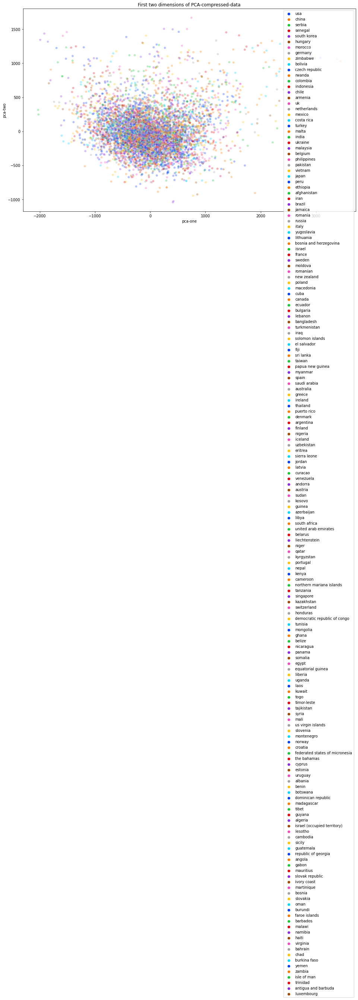

In [50]:
plt.figure(figsize=(16,10))
g_pca_2d = sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="birthplace",
    data=Features.loc[:,:],
    palette=sns.color_palette("bright", 176),
    legend="full",
    alpha=0.3
)

g_pca_2d.legend(loc='upper right')
g_pca_2d.set_title("First two dimensions of PCA-compressed-data")

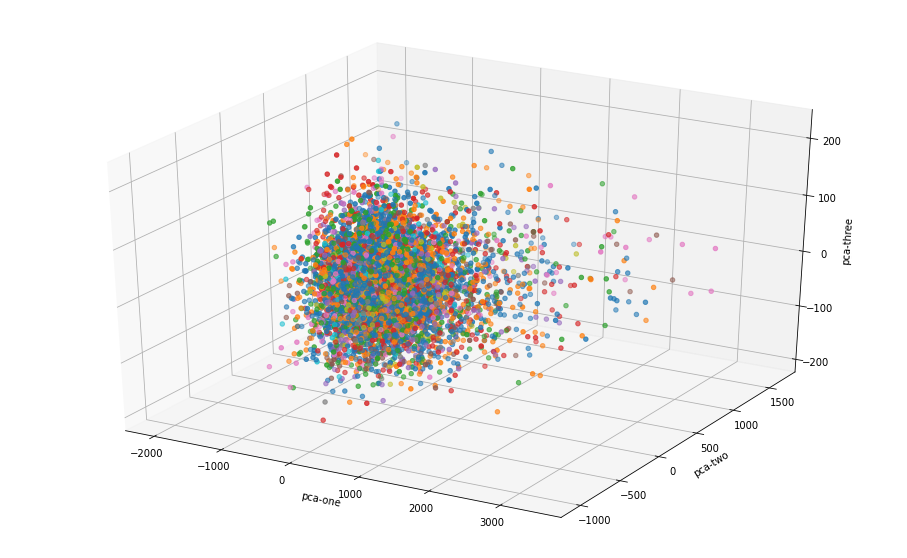

In [51]:
from mpl_toolkits.mplot3d import Axes3D
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=Features.loc[:,:]["pca-one"], 
    ys=Features.loc[:,:]["pca-two"], 
    zs=Features.loc[:,:]["pca-three"], 
    c=Features.loc[:,:]["numeric_labels"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')

plt.show()

In [52]:
df_subset = Features.loc[:].copy()
data_subset = df_subset[feat_headers].values
pca = PCA(n_components=3)
pca_result = pca.fit_transform(data_subset)
df_subset['pca-one'] = pca_result[:,0]
df_subset['pca-two'] = pca_result[:,1] 
df_subset['pca-three'] = pca_result[:,2]
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6414 samples in 0.005s...
[t-SNE] Computed neighbors for 6414 samples in 0.239s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6414
[t-SNE] Computed conditional probabilities for sample 2000 / 6414
[t-SNE] Computed conditional probabilities for sample 3000 / 6414
[t-SNE] Computed conditional probabilities for sample 4000 / 6414
[t-SNE] Computed conditional probabilities for sample 5000 / 6414
[t-SNE] Computed conditional probabilities for sample 6000 / 6414
[t-SNE] Computed conditional probabilities for sample 6414 / 6414
[t-SNE] Mean sigma: 82.525472
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.877052
[t-SNE] KL divergence after 300 iterations: 1.887178
t-SNE done! Time elapsed: 18.62151288986206 seconds


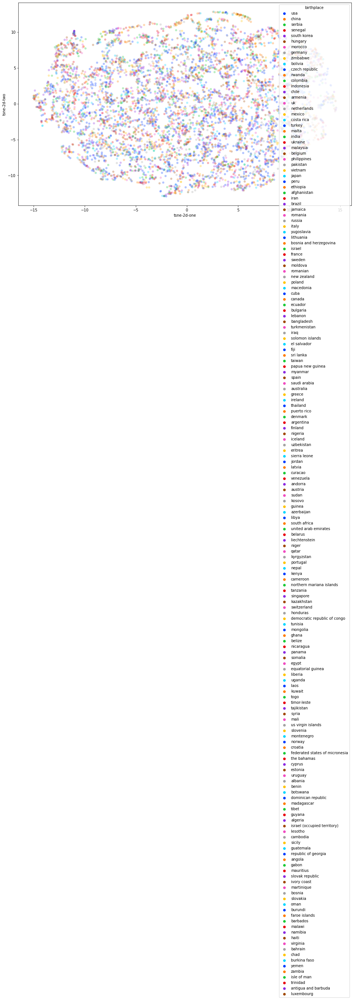

In [53]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 176),
    data=df_subset,
    legend="full",
    alpha=0.3
)

In [54]:
selected_countries = ['pakistan', 'afghanistan', 'france', 'nigeria', 'india']
selected_features = Features[Features.birthplace.isin(selected_countries) ]
selected_features.head()

,zcr,chroma_stft0,chroma_stft1,chroma_stft2,chroma_stft3,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,...,mel127,centroid,bandwidth,rolloff,accent,birthplace,numeric_labels,pca-one,pca-two,pca-three
84,0.436201,0.686410,0.947567,0.472480,0.452274,0.639429,0.621687,0.638988,0.901480,0.643972,...,1.240343e-07,4946.751577,2878.646306,8610.804932,gujarati,india,22,-29.475115,159.115670,67.570038
85,0.448359,0.879913,0.915680,0.561043,0.672255,0.793332,0.672214,0.783310,0.913413,0.649803,...,3.079596e-06,5167.855035,3008.558219,8762.506348,gujarati,india,22,186.356171,15.113865,121.361585
86,0.447984,0.727283,0.928001,0.458472,0.441067,0.631907,0.629654,0.654900,0.904328,0.653940,...,3.415401e-08,5056.405321,2907.379629,8842.308398,gujarati,india,22,80.645461,135.374674,-9.951807
117,0.411441,0.159628,0.273582,0.615520,0.431524,0.661014,0.941422,0.896350,0.661868,0.222471,...,6.338755e-05,4984.830826,3294.437064,9643.810660,urdu,pakistan,27,-4.359141,-259.924062,36.178354
118,0.425676,0.341270,0.461437,0.735090,0.548305,0.818032,0.937671,0.915634,0.654589,0.353887,...,6.822203e-05,5161.816871,3242.650104,9578.051570,urdu,pakistan,27,173.228815,-219.591662,107.502853


In [55]:
df_subset = selected_features.loc[:].copy()
data_subset = df_subset[feat_headers].values
pca = PCA(n_components=3)
pca_result = pca.fit_transform(data_subset)
df_subset['pca-one'] = pca_result[:,0]
df_subset['pca-two'] = pca_result[:,1] 
df_subset['pca-three'] = pca_result[:,2]
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 438 samples in 0.001s...
[t-SNE] Computed neighbors for 438 samples in 0.019s...
[t-SNE] Computed conditional probabilities for sample 438 / 438
[t-SNE] Mean sigma: 228.336425
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.618023
[t-SNE] KL divergence after 300 iterations: 0.414391
t-SNE done! Time elapsed: 1.125870704650879 seconds


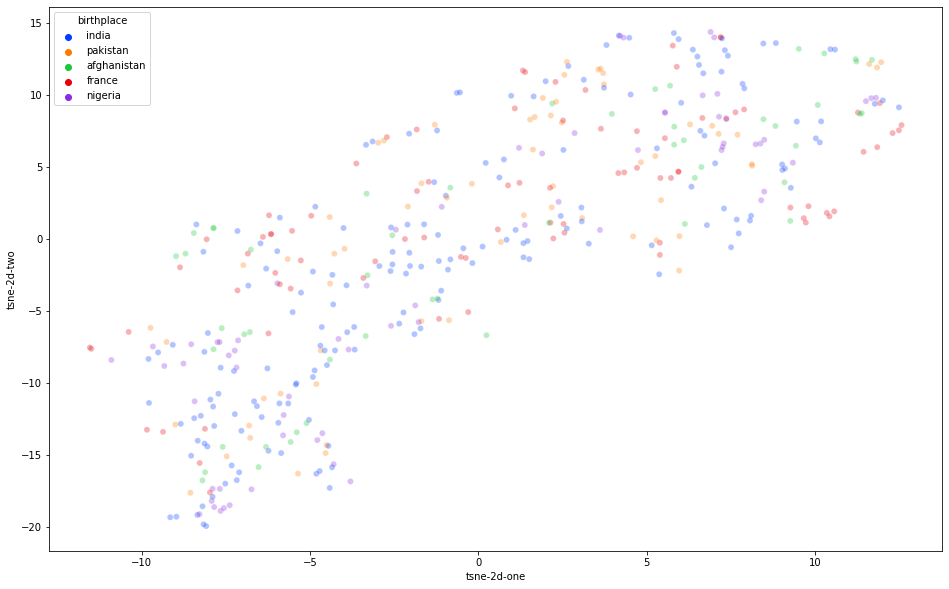

In [56]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3
)

In [57]:
pca_5 = PCA(n_components=5)
pca_result_5 = pca_5.fit_transform(data_subset)
print('Explained variation for 5 principal components: {}'.format(pca_5.explained_variance_ratio_))
print('Cumulative explained variation for 5 principal components: {}'.format(np.sum(pca_5.explained_variance_ratio_)))

Explained variation for 5 principal components: [0.79155825 0.17973778 0.02094215 0.00342755 0.00089697]
Cumulative explained variation for 5 principal components: 0.9965626967762943


In [58]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_result_5)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 1.0511066913604736 seconds


Text(0.5, 1.0, 't-SNE plot of PCA (compressed into 5 dimensions)')

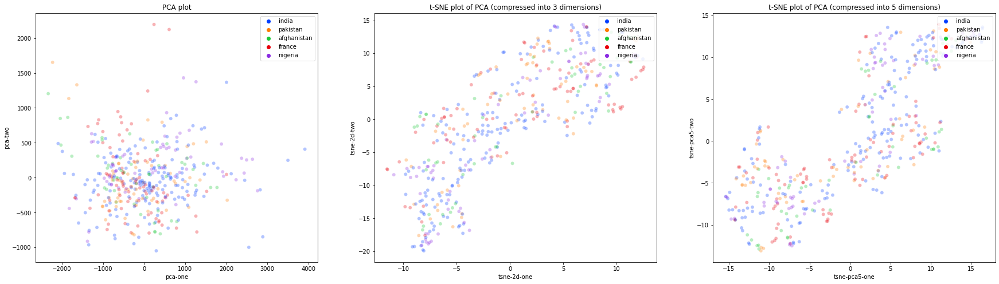

In [59]:
df_subset['tsne-pca5-one'] = tsne_pca_results[:,0]
df_subset['tsne-pca5-two'] = tsne_pca_results[:,1]


plt.figure(figsize=(30,8))
ax1 = plt.subplot(1, 3, 1)
g1 = sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax1
)
ax2 = plt.subplot(1, 3, 2)
g2 = sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax2
)
ax3 = plt.subplot(1, 3, 3)
g3 = sns.scatterplot(
    x="tsne-pca5-one", y="tsne-pca5-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax3
)

g1.legend(loc='upper right')
g1.set_title("PCA plot")
g2.legend(loc='upper right')
g2.set_title("t-SNE plot of PCA (compressed into 3 dimensions)")
g3.legend(loc='upper right')
g3.set_title("t-SNE plot of PCA (compressed into 5 dimensions)")


### With selected features 

In [60]:
SelectedFeatures = Features[FinalFeatures_list + ['birthplace']]

SelectedFeatures.head()

,mel77,mel80,mel65,mel72,mel63,mel52,mel87,mel76,birthplace
0,6.511162e-05,4.509356e-06,0.000002,0.000001,0.000363,2.836663e-06,1.467653e-06,0.000008,usa
1,6.682516e-05,5.829217e-06,0.000004,0.000003,0.000365,4.451297e-06,3.285471e-06,0.000010,usa
2,1.672784e-07,3.140644e-07,0.000047,0.000003,0.000003,1.278437e-07,3.153906e-08,0.000013,usa
3,1.489575e-05,2.827678e-05,0.000008,0.000009,0.000005,1.171277e-04,8.184546e-05,0.000002,china
4,1.487962e-05,2.830513e-05,0.000008,0.000010,0.000005,1.173919e-04,8.193284e-05,0.000002,china


In [61]:
SelectedFeatures.to_csv('selectedfeatures.csv', index=False)

In [62]:
SelectedFeatures = pd.DataFrame()
SelectedFeatures = pd.read_csv('/content/selectedfeatures.csv')
SelectedFeatures.head()

,mel77,mel80,mel65,mel72,mel63,mel52,mel87,mel76,birthplace
0,6.511162e-05,4.509356e-06,0.000002,0.000001,0.000363,2.836663e-06,1.467653e-06,0.000008,usa
1,6.682516e-05,5.829217e-06,0.000004,0.000003,0.000365,4.451297e-06,3.285471e-06,0.000010,usa
2,1.672784e-07,3.140644e-07,0.000047,0.000003,0.000003,1.278437e-07,3.153906e-08,0.000013,usa
3,1.489575e-05,2.827678e-05,0.000008,0.000009,0.000005,1.171277e-04,8.184546e-05,0.000002,china
4,1.487962e-05,2.830513e-05,0.000008,0.000010,0.000005,1.173919e-04,8.193284e-05,0.000002,china


In [63]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(Features.iloc[: , :6].values)

# add new columns to our dataFrame: pca-one, pca-two, pca-three
Features['pca-one'] = pca_result[:,0]
Features['pca-two'] = pca_result[:,1] 
Features['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.42002465 0.30316037 0.14239229]


Text(0.5, 1.0, 'First two dimensions of PCA-compressed-data')

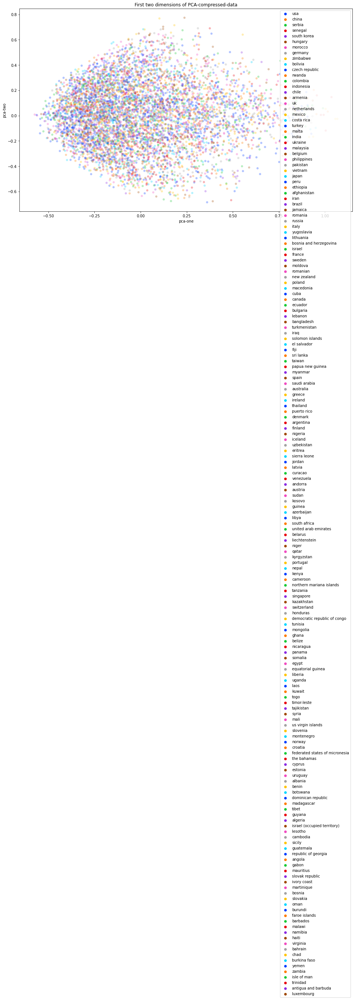

In [64]:
plt.figure(figsize=(16,10))
g_pca_2d = sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="birthplace",
    data=Features.loc[:,:],
    palette=sns.color_palette("bright", 176),
    legend="full",
    alpha=0.3
)

g_pca_2d.legend(loc='upper right')
g_pca_2d.set_title("First two dimensions of PCA-compressed-data")

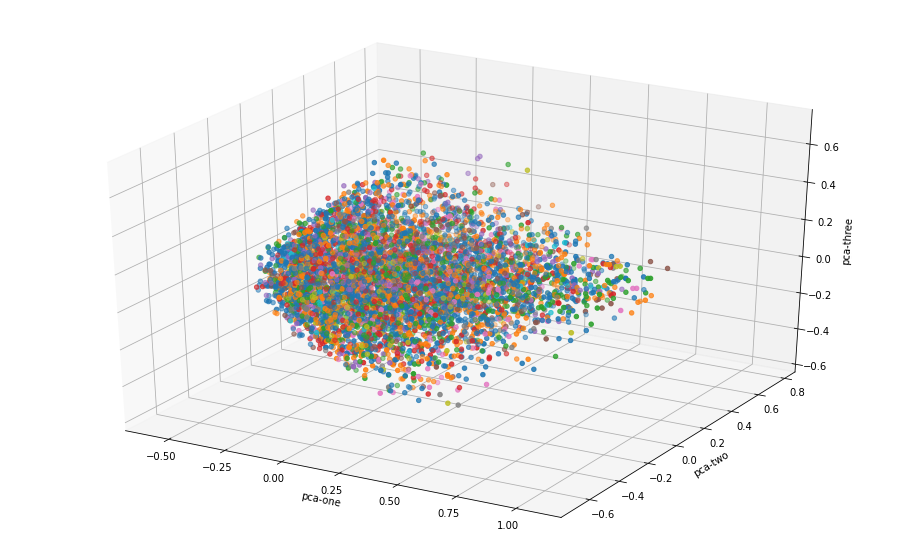

In [65]:
from mpl_toolkits.mplot3d import Axes3D
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=Features.loc[:,:]["pca-one"], 
    ys=Features.loc[:,:]["pca-two"], 
    zs=Features.loc[:,:]["pca-three"], 
    c=Features.loc[:,:]["numeric_labels"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')

plt.show()

In [66]:
df_subset = Features.loc[:].copy()
data_subset = df_subset[feat_headers].values
pca = PCA(n_components=3)
pca_result = pca.fit_transform(data_subset)
df_subset['pca-one'] = pca_result[:,0]
df_subset['pca-two'] = pca_result[:,1] 
df_subset['pca-three'] = pca_result[:,2]
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6414 samples in 0.021s...
[t-SNE] Computed neighbors for 6414 samples in 0.234s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6414
[t-SNE] Computed conditional probabilities for sample 2000 / 6414
[t-SNE] Computed conditional probabilities for sample 3000 / 6414
[t-SNE] Computed conditional probabilities for sample 4000 / 6414
[t-SNE] Computed conditional probabilities for sample 5000 / 6414
[t-SNE] Computed conditional probabilities for sample 6000 / 6414
[t-SNE] Computed conditional probabilities for sample 6414 / 6414
[t-SNE] Mean sigma: 82.525472
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.828865
[t-SNE] KL divergence after 300 iterations: 1.888108
t-SNE done! Time elapsed: 19.43417739868164 seconds


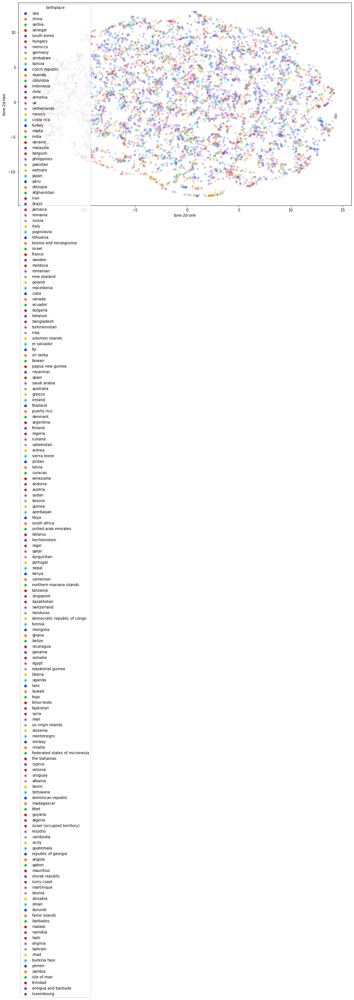

In [67]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 176),
    data=df_subset,
    legend="full",
    alpha=0.3
)

In [68]:
selected_countries = ['pakistan', 'afghanistan', 'france', 'nigeria', 'india']
selected_features = Features[Features.birthplace.isin(selected_countries) ]
selected_features.head()

,zcr,chroma_stft0,chroma_stft1,chroma_stft2,chroma_stft3,chroma_stft4,chroma_stft5,chroma_stft6,chroma_stft7,chroma_stft8,...,mel127,centroid,bandwidth,rolloff,accent,birthplace,numeric_labels,pca-one,pca-two,pca-three
84,0.436201,0.686410,0.947567,0.472480,0.452274,0.639429,0.621687,0.638988,0.901480,0.643972,...,1.240343e-07,4946.751577,2878.646306,8610.804932,gujarati,india,22,0.013792,-0.249410,-0.143225
85,0.448359,0.879913,0.915680,0.561043,0.672255,0.793332,0.672214,0.783310,0.913413,0.649803,...,3.079596e-06,5167.855035,3008.558219,8762.506348,gujarati,india,22,-0.242392,-0.173572,-0.284872
86,0.447984,0.727283,0.928001,0.458472,0.441067,0.631907,0.629654,0.654900,0.904328,0.653940,...,3.415401e-08,5056.405321,2907.379629,8842.308398,gujarati,india,22,0.027805,-0.270748,-0.172517
117,0.411441,0.159628,0.273582,0.615520,0.431524,0.661014,0.941422,0.896350,0.661868,0.222471,...,6.338755e-05,4984.830826,3294.437064,9643.810660,urdu,pakistan,27,0.392525,0.363380,0.217328
118,0.425676,0.341270,0.461437,0.735090,0.548305,0.818032,0.937671,0.915634,0.654589,0.353887,...,6.822203e-05,5161.816871,3242.650104,9578.051570,urdu,pakistan,27,0.072051,0.298413,0.101357


In [69]:
df_subset = selected_features.loc[:].copy()
data_subset = df_subset[feat_headers].values
pca = PCA(n_components=3)
pca_result = pca.fit_transform(data_subset)
df_subset['pca-one'] = pca_result[:,0]
df_subset['pca-two'] = pca_result[:,1] 
df_subset['pca-three'] = pca_result[:,2]
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 438 samples in 0.001s...
[t-SNE] Computed neighbors for 438 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 438 / 438
[t-SNE] Mean sigma: 228.336425
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.716248
[t-SNE] KL divergence after 300 iterations: 0.412670
t-SNE done! Time elapsed: 1.1919586658477783 seconds


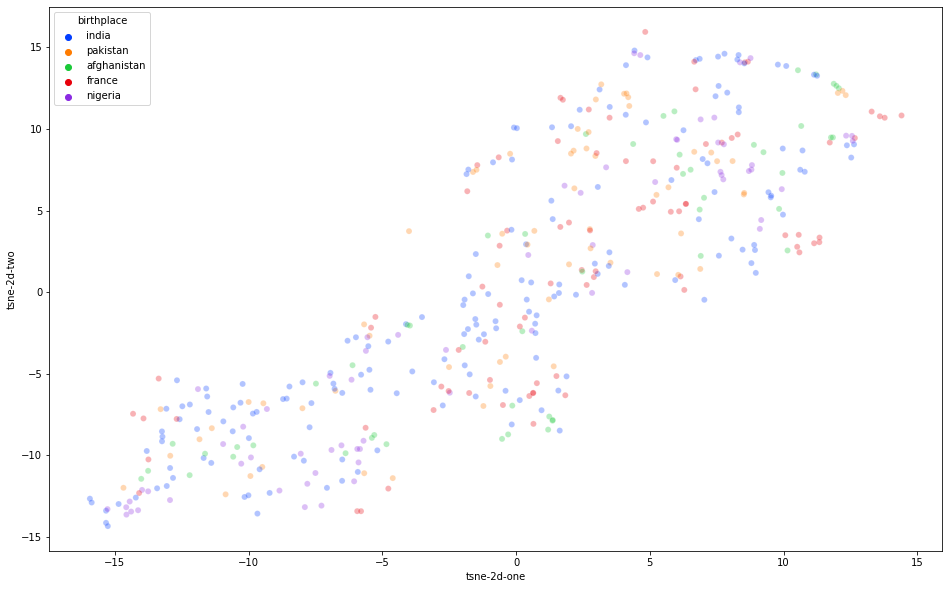

In [70]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3
)

In [71]:
pca_5 = PCA(n_components=5)
pca_result_5 = pca_5.fit_transform(data_subset)
print('Explained variation for 5 principal components: {}'.format(pca_5.explained_variance_ratio_))
print('Cumulative explained variation for 5 principal components: {}'.format(np.sum(pca_5.explained_variance_ratio_)))

Explained variation for 5 principal components: [0.79155825 0.17973778 0.02094215 0.00342755 0.00089697]
Cumulative explained variation for 5 principal components: 0.9965626967762943


In [72]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_result_5)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 1.0764248371124268 seconds


Text(0.5, 1.0, 't-SNE plot of PCA (compressed into 5 dimensions)')

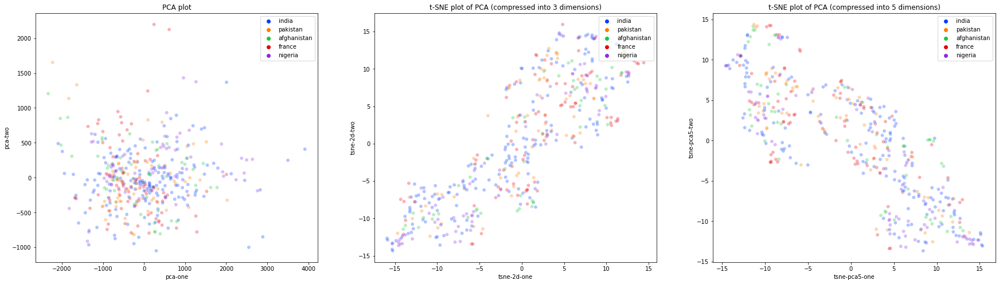

In [73]:
df_subset['tsne-pca5-one'] = tsne_pca_results[:,0]
df_subset['tsne-pca5-two'] = tsne_pca_results[:,1]


plt.figure(figsize=(30,8))
ax1 = plt.subplot(1, 3, 1)
g1 = sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax1
)
ax2 = plt.subplot(1, 3, 2)
g2 = sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax2
)
ax3 = plt.subplot(1, 3, 3)
g3 = sns.scatterplot(
    x="tsne-pca5-one", y="tsne-pca5-two",
    hue="birthplace",
    palette=sns.color_palette("bright", 5),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax3
)

g1.legend(loc='upper right')
g1.set_title("PCA plot")
g2.legend(loc='upper right')
g2.set_title("t-SNE plot of PCA (compressed into 3 dimensions)")
g3.legend(loc='upper right')
g3.set_title("t-SNE plot of PCA (compressed into 5 dimensions)")


## Anamoly / Outliers Detection

In [74]:
MinimizedFeatures = SelectedFeatures.copy()
MinimizedFeatures.shape

(6414, 9)

In [75]:
minmax = MinMaxScaler(feature_range = (0, 1))
col0 = MinimizedFeatures.columns[0]
col1 = MinimizedFeatures.columns[1]

MinimizedFeatures[[col0, col1]] = minmax.fit_transform(MinimizedFeatures[[col0, col1]])
MinimizedFeatures[[col0, col1]].head()

,mel77,mel80
0,0.003438,0.000213
1,0.003529,0.000275
2,0.000009,0.000015
3,0.000787,0.001333
4,0.000786,0.001334


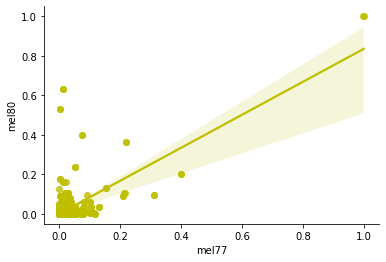

In [76]:
# Plot corr
sns.regplot(x = col0, 
            y = col1, data = MinimizedFeatures,
            color = 'y')

sns.despine();

In [77]:
X1 = SelectedFeatures[col0].values.reshape(-1,1)
X2 = SelectedFeatures[col1].values.reshape(-1,1)

X = np.concatenate((X1,X2),axis=1)
len(X)==X.shape[0]

True

### Cluster-based Local Outlier Factor (CBLOF)

In [78]:
outliers_fraction = 0.01

xx , yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))

clf = CBLOF(contamination = outliers_fraction,
            check_estimator = False, random_state = 0)
clf.fit(X)

# predict raw anomaly score
scores_pred = clf.decision_function(X) * -1
        
# Identify point as outlier or inlier
y_pred = clf.predict(X)
n_inliers = len(y_pred) - np.count_nonzero(y_pred)
n_outliers = np.count_nonzero(y_pred == 1)

In [79]:
SelectedFeatures1 = SelectedFeatures
SelectedFeatures1['outlier'] = y_pred.tolist() # store predictions in df
    
# 
inliers_0 = np.array(SelectedFeatures1[col0][SelectedFeatures1['outlier'] == 0]).reshape(-1,1)
inliers_1 = np.array(SelectedFeatures1[col1][SelectedFeatures1['outlier'] == 0]).reshape(-1,1)
    
# sales - outlier feature 1, profit - outlier feature 2
outliers_0 = SelectedFeatures1[col0][SelectedFeatures1['outlier'] == 1].values.reshape(-1,1)
outliers_1 = SelectedFeatures1[col1][SelectedFeatures1['outlier'] == 1].values.reshape(-1,1)
         
print('Inliers:',n_inliers,
      'Outliers:',n_outliers,
      '\nTotal:', n_inliers+n_outliers)


Inliers: 6349 Outliers: 65 
Total: 6414


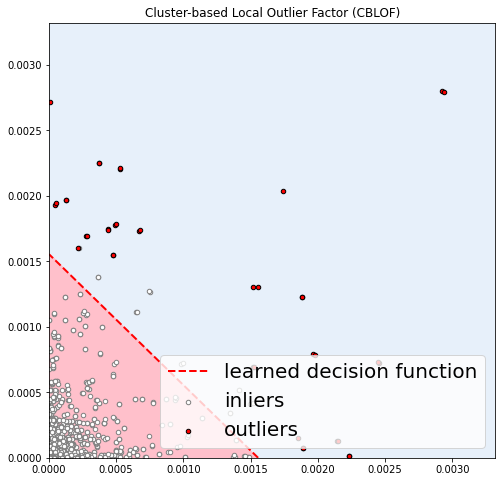

In [80]:
plt.figure(figsize=(8, 8))

# Threshold val for identifying outs and ins 
threshold = percentile(scores_pred, 100 * outliers_fraction)
        
# decision function calculates the raw anomaly score for every point
Z = clf.decision_function(np.c_[xx.ravel(), 
                                yy.ravel()]) * -1
Z = Z.reshape(xx.shape)
# fill blue map colormap from minimum anomaly score to threshold value
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 
                                           threshold, 7),
             cmap = plt.cm.Blues_r)

# red contour line where anomaly score =thresold
a = plt.contour(xx, yy, Z, 
                levels=[threshold],
                linewidths = 2, colors = 'red')
        
# orange contour lines where range of anomaly score covers threshold val to max anomaly score
plt.contourf(xx, yy, Z, 
             levels = [threshold, Z.max()],
             colors = 'pink')

b = plt.scatter(inliers_0, inliers_1, 
                c = 'white',s = 20, edgecolor = '#808080')
    
c = plt.scatter(outliers_0, outliers_1, 
                c = 'red',s=20, edgecolor = 'k')

plt.axis('tight')   
plt.legend([a.collections[0], b,c],
           ['learned decision function', 'inliers','outliers'],
           prop = mpfm.FontProperties(size = 20),
           loc = 'lower right')
      
plt.xlim((0, 0.003320))
plt.ylim((0, 0.003320))
plt.title('Cluster-based Local Outlier Factor (CBLOF)')
plt.show();

In [81]:
# remove outlying rows
InlyingFeatures = (SelectedFeatures1[SelectedFeatures1.outlier != 1])
# drop last unrequired column
InlyingFeatures.drop(columns=InlyingFeatures.columns[-1], 
        axis=1, 
        inplace=True)
InlyingFeatures.shape

(6349, 9)

In [82]:
InlyingFeatures.head()

,mel77,mel80,mel65,mel72,mel63,mel52,mel87,mel76,birthplace
0,6.511162e-05,4.509356e-06,0.000002,0.000001,0.000363,2.836663e-06,1.467653e-06,0.000008,usa
1,6.682516e-05,5.829217e-06,0.000004,0.000003,0.000365,4.451297e-06,3.285471e-06,0.000010,usa
2,1.672784e-07,3.140644e-07,0.000047,0.000003,0.000003,1.278437e-07,3.153906e-08,0.000013,usa
3,1.489575e-05,2.827678e-05,0.000008,0.000009,0.000005,1.171277e-04,8.184546e-05,0.000002,china
4,1.487962e-05,2.830513e-05,0.000008,0.000010,0.000005,1.173919e-04,8.193284e-05,0.000002,china


In [83]:
InlyingFeatures.to_csv('inlyingfeatures.csv', index = False)